# **Lab3 : Image Segmentation (Histogram of Oriented Gradients & K-Mean Clustering)**

In [39]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import measure


import glob

from sklearn.cluster import KMeans

from scipy import spatial

from tqdm import tqdm
import cv2
import os 
import random

## Load Image

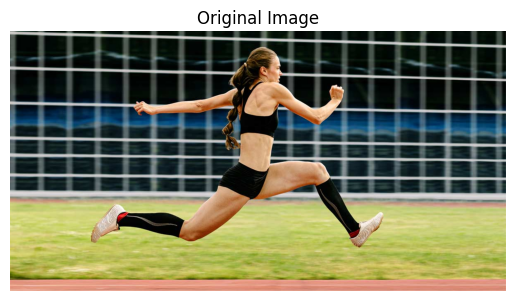

In [40]:
### START CODE HERE ###
image = cv2.imread('asset/running.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')
plt.show()
### END CODE HERE ###

## Histogram of Oriented Gradients

Blur the image then apply to the [`hog()`](<https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.hog:~:text=skimage.feature.hog(,%23>)
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/refs/heads/main/Lab3_Image-Segmentation/asset/1.png?raw=true)
</details>

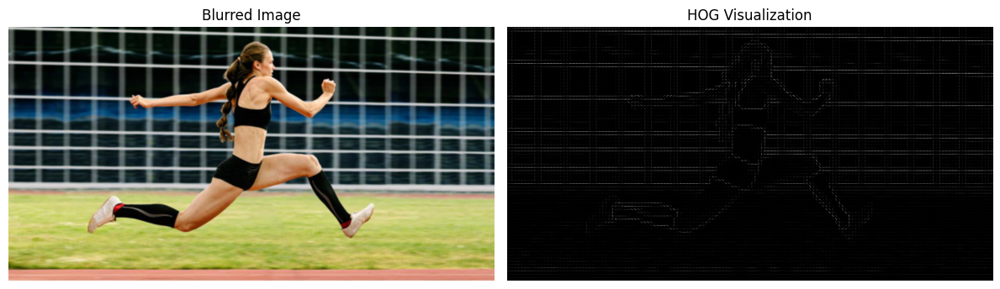

In [41]:
### START CODE HERE ###
blurry_image = cv2.GaussianBlur(image, (5, 5), 0)
gray_image = cv2.cvtColor(blurry_image, cv2.COLOR_RGB2GRAY)
fd, hog_image = hog(gray_image, orientations=9, pixels_per_cell=(8, 8),
                    cells_per_block=(2, 2), visualize=True, block_norm='L2-Hys')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(blurry_image)
ax1.set_title('Blurred Image')
ax1.axis('off')

ax2.imshow(hog_image, cmap='gray')
ax2.set_title('HOG Visualization')
ax2.axis('off')
plt.tight_layout()
plt.show()
### END CODE HERE ###

Complete the `HOGSubimageExtractor()`.

That extracts Histogram of Oriented Gradients features from sub-images of a larger image. It divides the image into overlapping tiles, computes HOG features for each tile, and stores both the feature vectors and visualizations. The class also provides a method to plot the HOG visualizations.

**Attributes:**
- `image`: The input image.
- `tile_size`: The size of each sub-image to extract.
- `stride`: The pixel stride between consecutive sub-images.
- `hGrid`: An array of indices representing the starting positions for rows of sub-images.
- `wGrid`: An array of indices representing the starting positions for columns of sub-images.
- `hog_features`: A list to store the HOG feature vectors for each sub-image.
- `hog_images`: A list to store the visualized HOG images for each sub-image (optional).

**Methods:**
- `extract_hog_features()`: Compute HOG features for each sub-image.
- `plot_hog_images()`: Plots the HOG visualization images.
- `get_num_grid()`: Return the number of rows and columns in the grid of sub-images.


In [42]:
### START CODE HERE ###
class HOGSubimageExtractor:
    def __init__(self, image, tile_size, stride):
        self.image = image
        self.tile_size = tile_size
        self.stride = stride
        self.h, self.w, _ = image.shape
        self.hGrid = np.arange(0, self.h - tile_size + 1, stride)
        self.wGrid = np.arange(0, self.w - tile_size + 1, stride)
        self.hog_features = []
        self.hog_images = []
        self.extract_hog_features()

    def extract_hog_features(self):
        for h_idx in self.hGrid:
            for w_idx in self.wGrid:
                # Extract sub-image
                sub_image = self.image[h_idx:h_idx + self.tile_size, 
                                     w_idx:w_idx + self.tile_size]
                
                # Convert to grayscale
                gray_sub = cv2.cvtColor(sub_image, cv2.COLOR_RGB2GRAY)
                
                # Apply Gaussian blur
                blurred_sub = cv2.GaussianBlur(gray_sub, (3, 3), 0)
                
                # Extract HOG features
                fd, hog_img = hog(blurred_sub, orientations=9, 
                                pixels_per_cell=(8, 8), cells_per_block=(2, 2),
                                visualize=True, block_norm='L2-Hys')
                
                self.hog_features.append(fd)
                self.hog_images.append(hog_img)

    def plot_hog_images(self):
        n_rows = len(self.hGrid)
        n_cols = len(self.wGrid)
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2))
        
        if n_rows == 1 and n_cols == 1:
            axes = [[axes]]
        elif n_rows == 1:
            axes = [axes]
        elif n_cols == 1:
            axes = [[ax] for ax in axes]
        
        for i, h_idx in enumerate(self.hGrid):
            for j, w_idx in enumerate(self.wGrid):
                idx = i * len(self.wGrid) + j
                axes[i][j].imshow(self.hog_images[idx], cmap='gray')
                axes[i][j].set_title(f'HOG ({h_idx},{w_idx})')
                axes[i][j].axis('off')
        
        plt.tight_layout()
        plt.show()

    def get_num_grid(self):
        return len(self.hGrid), len(self.wGrid)
### END CODE HERE ###

Let's use `HOGSubimageExtractor()` in the cell below.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output from hog_extractor.plot_hog_images()</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/refs/heads/main/Lab3_Image-Segmentation/asset/2.png)
</details>

Number of grids: (18, 36)


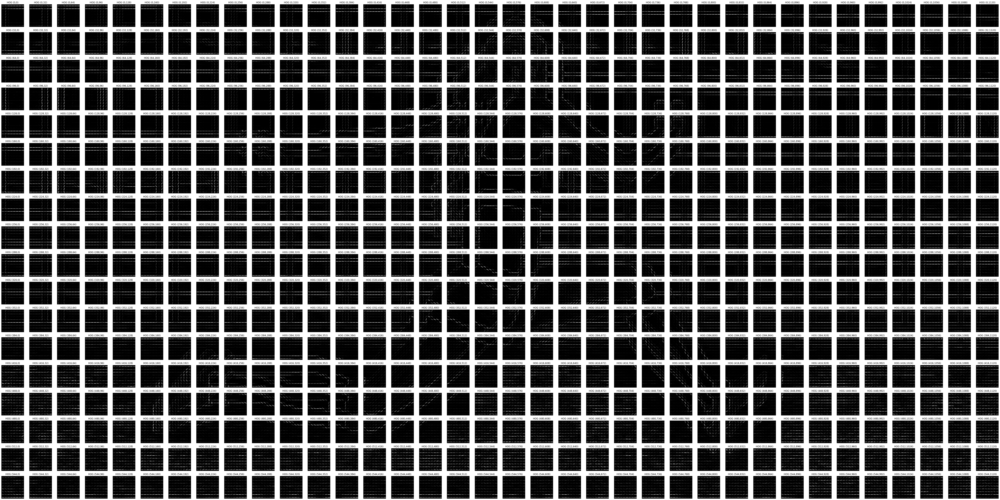

In [43]:
### START CODE HERE ###
tile_size = 64
stride = 32
hog_extractor = HOGSubimageExtractor(image, tile_size, stride)
num_grid = hog_extractor.get_num_grid()
print(f'Number of grids: {num_grid}')
hog_extractor.plot_hog_images()
### END CODE HERE ###

## K-Mean Clustering
Complete the `KMeansCluster()`.
Perform K-means clustering on Histogram of Oriented Gradients (HOG) features extracted from an image.
**Attriburtes:**
- `hog_extractor`: An object responsible for extractin HOG features from an image.
- `n_clusters`: The number of clusters to use in K-means.
- `cluster_array`: A 2D array representing the cluster assignments for each grid cell.
- `all_labels`: A 2D array representing the connected components (objects) identified after clustering.
- `bounding_boxes`: A list of tuples containing (object_id, start_coordinates, end_coordinates) for each detected object.

**Method:**
- `perform_clustering()`: Performs K-means clustering on the HOG features extracted by the hog_extractor object.<br>
It then reshapes the cluster assignmentss into a grid and identifies connected components using the `measure.label()` function.
- `plot_cluster_and_labels()`: Visualize the cluster assignments and connected components as images using Matplotlib.
- `get_bounding_boxes()`: Extracts bounding boxes for each detected object.

In [44]:
### START CODE HERE ###
class KMeansCluster:
    def __init__(self, hog_extractor, n_clusters=3, random_state=42):
        self.hog_extractor = hog_extractor
        self.n_clusters = n_clusters
        self.random_state = random_state
        self.cluster_array = None
        self.all_labels = None
        self.bounding_boxes = []
        self.perform_clustering()

    def perform_clustering(self):
        # Perform K-means clustering on HOG features
        kmeans = KMeans(n_clusters=self.n_clusters, random_state=self.random_state)
        hog_features = np.array(self.hog_extractor.hog_features)
        cluster_labels = kmeans.fit_predict(hog_features)
        
        # Reshape cluster labels to grid
        n_rows, n_cols = self.hog_extractor.get_num_grid()
        self.cluster_array = cluster_labels.reshape(n_rows, n_cols)
        
        # Find connected components
        self.all_labels = measure.label(self.cluster_array)

    def plot_cluster_and_labels(self):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        
        # Plot cluster assignments
        im1 = ax1.imshow(self.cluster_array, cmap='viridis')
        ax1.set_title('K-means Cluster Assignments')
        ax1.axis('off')
        plt.colorbar(im1, ax=ax1)
        
        # Plot connected components
        im2 = ax2.imshow(self.all_labels, cmap='tab10')
        ax2.set_title('Connected Components (Labels)')
        ax2.axis('off')
        plt.colorbar(im2, ax=ax2)
        
        plt.tight_layout()
        plt.show()

    def get_bounding_boxes(self):
        self.bounding_boxes = []
        
        for region in measure.regionprops(self.all_labels):
            if region.area > 1:  # Filter out single pixel regions
                min_row, min_col, max_row, max_col = region.bbox
                
                # Convert grid coordinates to image coordinates
                h_start = self.hog_extractor.hGrid[min_row]
                w_start = self.hog_extractor.wGrid[min_col]
                h_end = self.hog_extractor.hGrid[max_row-1] + self.hog_extractor.tile_size
                w_end = self.hog_extractor.wGrid[max_col-1] + self.hog_extractor.tile_size
                
                # Ensure coordinates are within image bounds
                h_end = min(h_end, self.hog_extractor.h)
                w_end = min(w_end, self.hog_extractor.w)
                
                self.bounding_boxes.append((region.label, (w_start, h_start), (w_end, h_end)))
        
        return self.bounding_boxes
### END CODE HERE ###

Complete the function below. Using [`cv2.rectangle()`](<https://docs.opencv.org/4.x/dc/da5/tutorial_py_drawing_functions.html#:~:text=511%2C511)%2C(255%2C0%2C0)%2C5)-,Drawing%20Rectangle,-To%20draw%20a>)

In [45]:
### START CODE HERE ###
def draw_bbox(image, bboxes):
    # Create a copy of the image to draw on
    result_image = image.copy()
    
    # Define colors for different bounding boxes
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), 
              (255, 0, 255), (0, 255, 255), (128, 0, 128), (255, 165, 0)]
    
    for i, (object_id, start_coords, end_coords) in enumerate(bboxes):
        color = colors[i % len(colors)]
        cv2.rectangle(result_image, start_coords, end_coords, color, 2)
        
        # Add label
        label = f'Object {object_id}'
        cv2.putText(result_image, label, (start_coords[0], start_coords[1] - 10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(result_image)
    plt.title('Image with Bounding Boxes')
    plt.axis('off')
    plt.show()
    
    return result_image
### END CODE HERE ###

Let's use `KMeansCluster()` and `draw_bbox()` in the cell below.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image-3.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/refs/heads/main/Lab3_Image-Segmentation/asset/3.png?raw=true)

![image-4.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/refs/heads/main/Lab3_Image-Segmentation/asset/4.png?raw=true)
</details>

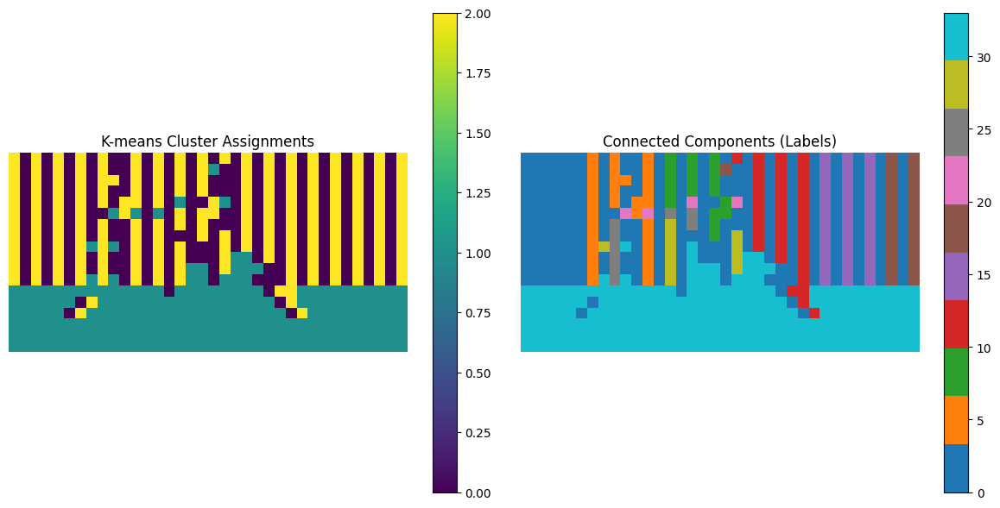

Found 24 objects


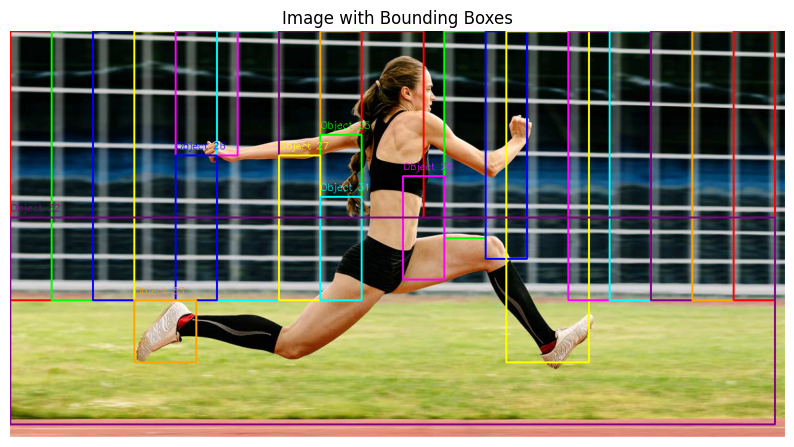

array([[[255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        ...,
        [  0,   3,   0],
        [  9,  11,   6],
        [ 21,  23,  18]],

       [[255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        ...,
        [  0,   4,   0],
        [  9,  11,   6],
        [ 21,  23,  18]],

       [[255,   0,   0],
        [255,   0,   0],
        [201, 202, 197],
        ...,
        [  0,   4,   0],
        [  9,  11,   6],
        [ 22,  24,  19]],

       ...,

       [[234, 172, 151],
        [233, 171, 150],
        [233, 171, 150],
        ...,
        [217, 142, 119],
        [219, 144, 121],
        [221, 146, 123]],

       [[226, 170, 147],
        [226, 170, 147],
        [226, 170, 147],
        ...,
        [213, 145, 126],
        [215, 147, 128],
        [216, 148, 129]],

       [[245, 191, 167],
        [245, 191, 167],
        [245, 191, 167],
        ...,
        [240, 173, 156],
        [242, 175, 158],
        [243, 176, 159]]

In [46]:
kmeans_cluster = KMeansCluster(hog_extractor, n_clusters=3, random_state=42)
kmeans_cluster.plot_cluster_and_labels()
bboxes = kmeans_cluster.get_bounding_boxes()
print(f"Found {len(bboxes)} objects")
draw_bbox(image, bboxes)

---

## Experiment
Do the experiment to identify 3 best parameters that produce the perfectly fitting bounding box of the object of interest in the image.

Experiment 1: Smaller tiles, smaller stride


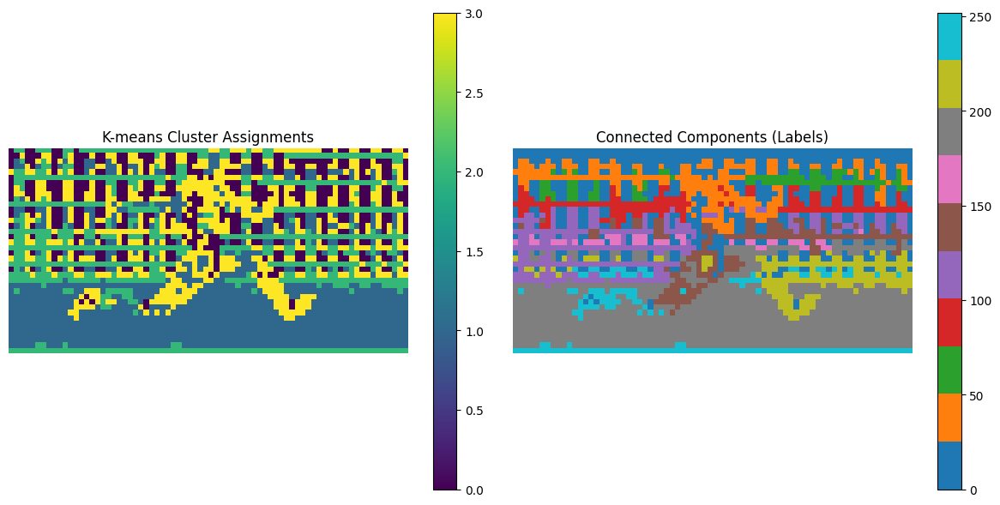

Experiment 1 - Found 180 objects


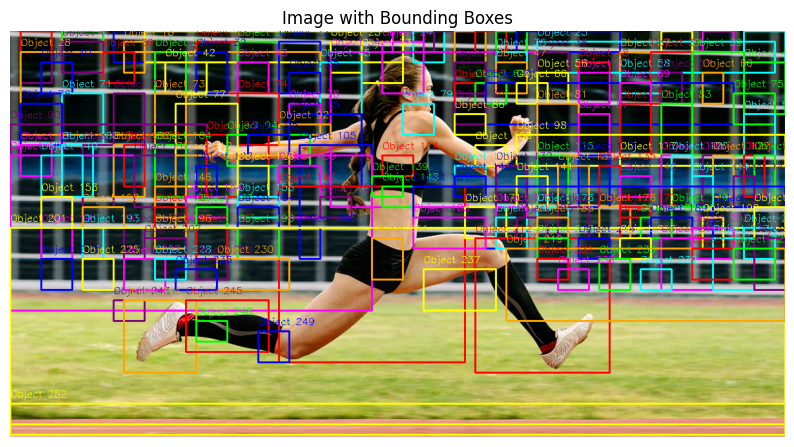

array([[[145, 150, 144],
        [145, 150, 144],
        [144, 149, 143],
        ...,
        [  0, 255, 255],
        [  0, 255, 255],
        [  0, 255, 255]],

       [[176, 178, 173],
        [175, 177, 172],
        [175, 177, 172],
        ...,
        [  0, 255, 255],
        [  0, 255, 255],
        [  0, 255, 255]],

       [[201, 202, 197],
        [201, 202, 197],
        [201, 202, 197],
        ...,
        [  0,   4,   0],
        [  9,  11,   6],
        [  0, 255, 255]],

       ...,

       [[255, 255,   0],
        [255, 255,   0],
        [255, 255,   0],
        ...,
        [255, 255,   0],
        [255, 255,   0],
        [255, 255,   0]],

       [[226, 170, 147],
        [226, 170, 147],
        [226, 170, 147],
        ...,
        [213, 145, 126],
        [215, 147, 128],
        [216, 148, 129]],

       [[245, 191, 167],
        [245, 191, 167],
        [245, 191, 167],
        ...,
        [240, 173, 156],
        [242, 175, 158],
        [243, 176, 159]]

In [47]:
### START CODE HERE ###
print("Experiment 1: Smaller tiles, smaller stride")
tile_size = 32
stride = 16

hog_extractor1 = HOGSubimageExtractor(image, tile_size, stride)
kmeans_cluster1 = KMeansCluster(hog_extractor1, n_clusters=4, random_state=42)
kmeans_cluster1.plot_cluster_and_labels()
bboxes1 = kmeans_cluster1.get_bounding_boxes()
print(f"Experiment 1 - Found {len(bboxes1)} objects")
draw_bbox(image, bboxes1)
### END CODE HERE ###

Experiment 2: Larger tiles, larger stride


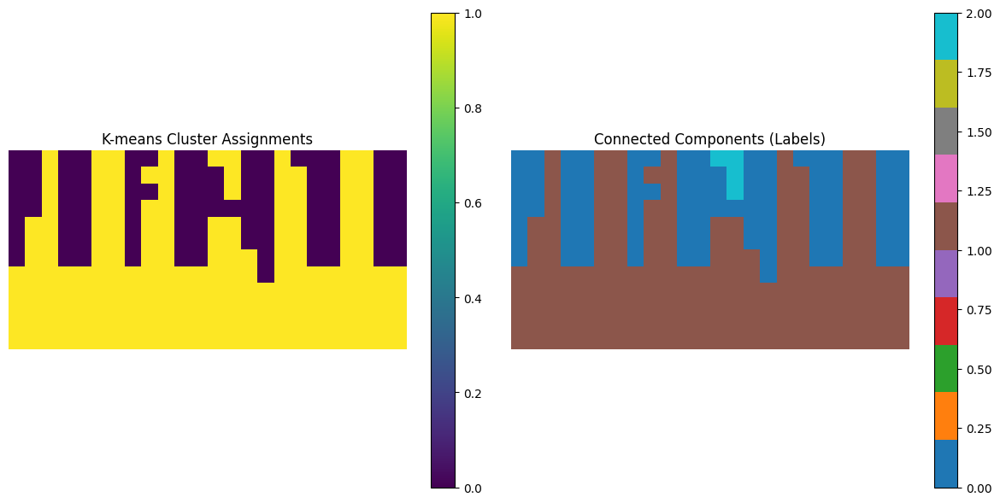

Experiment 2 - Found 2 objects


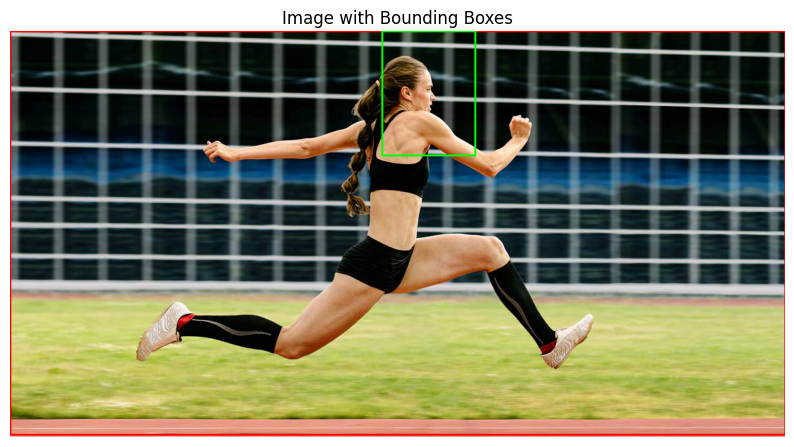

array([[[255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        ...,
        [255,   0,   0],
        [255,   0,   0],
        [255,   0,   0]],

       [[255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        ...,
        [255,   0,   0],
        [255,   0,   0],
        [255,   0,   0]],

       [[255,   0,   0],
        [255,   0,   0],
        [201, 202, 197],
        ...,
        [  0,   4,   0],
        [  9,  11,   6],
        [255,   0,   0]],

       ...,

       [[255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        ...,
        [255,   0,   0],
        [255,   0,   0],
        [255,   0,   0]],

       [[226, 170, 147],
        [226, 170, 147],
        [226, 170, 147],
        ...,
        [213, 145, 126],
        [215, 147, 128],
        [216, 148, 129]],

       [[245, 191, 167],
        [245, 191, 167],
        [245, 191, 167],
        ...,
        [240, 173, 156],
        [242, 175, 158],
        [243, 176, 159]]

In [48]:
### START CODE HERE ###
print("Experiment 2: Larger tiles, larger stride")
tile_size = 96
stride = 48

hog_extractor2 = HOGSubimageExtractor(image, tile_size, stride)
kmeans_cluster2 = KMeansCluster(hog_extractor2, n_clusters=2, random_state=42)
kmeans_cluster2.plot_cluster_and_labels()
bboxes2 = kmeans_cluster2.get_bounding_boxes()
print(f"Experiment 2 - Found {len(bboxes2)} objects")
draw_bbox(image, bboxes2)
### END CODE HERE ###

Experiment 3: Medium tiles, non-overlapping stride


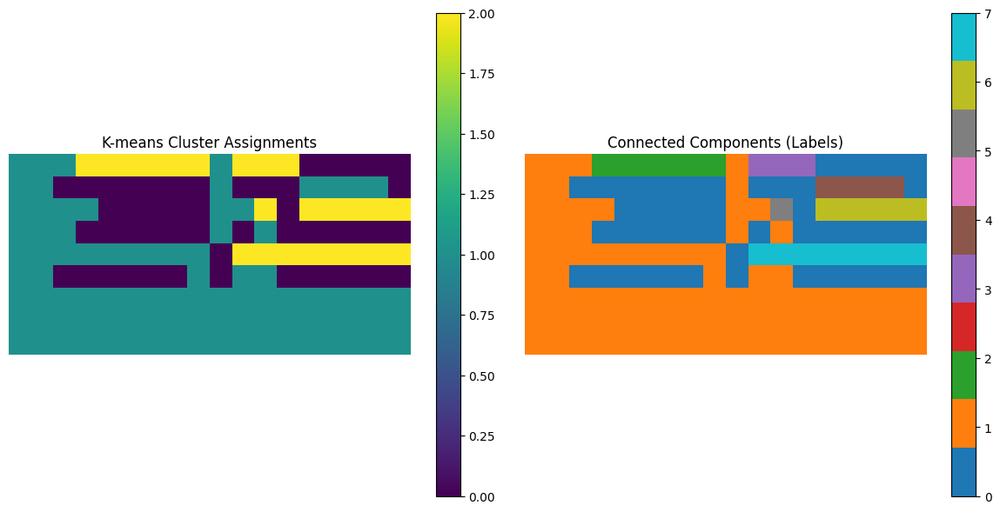

Experiment 3 - Found 6 objects


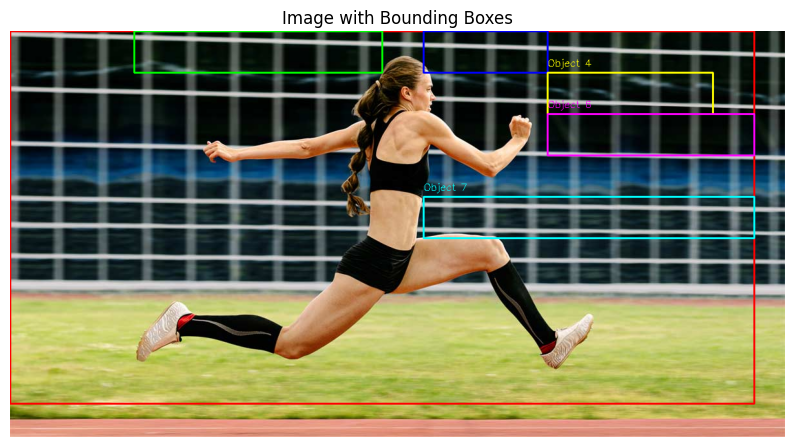

array([[[255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        ...,
        [  0,   3,   0],
        [  9,  11,   6],
        [ 21,  23,  18]],

       [[255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        ...,
        [  0,   4,   0],
        [  9,  11,   6],
        [ 21,  23,  18]],

       [[255,   0,   0],
        [255,   0,   0],
        [201, 202, 197],
        ...,
        [  0,   4,   0],
        [  9,  11,   6],
        [ 22,  24,  19]],

       ...,

       [[234, 172, 151],
        [233, 171, 150],
        [233, 171, 150],
        ...,
        [217, 142, 119],
        [219, 144, 121],
        [221, 146, 123]],

       [[226, 170, 147],
        [226, 170, 147],
        [226, 170, 147],
        ...,
        [213, 145, 126],
        [215, 147, 128],
        [216, 148, 129]],

       [[245, 191, 167],
        [245, 191, 167],
        [245, 191, 167],
        ...,
        [240, 173, 156],
        [242, 175, 158],
        [243, 176, 159]]

In [49]:
### START CODE HERE ###
print("Experiment 3: Medium tiles, non-overlapping stride")
tile_size = 64
stride = 64

hog_extractor3 = HOGSubimageExtractor(image, tile_size, stride)
kmeans_cluster3 = KMeansCluster(hog_extractor3, n_clusters=3, random_state=42)
kmeans_cluster3.plot_cluster_and_labels()
bboxes3 = kmeans_cluster3.get_bounding_boxes()
print(f"Experiment 3 - Found {len(bboxes3)} objects")
draw_bbox(image, bboxes3)
### END CODE HERE ###

---

## **Question** 
1. How do the parameters of Gaussian blur, such as kernel size and standard deviation, affect the image processing in the context of k-means clustering?

2. How do the configurations of cells per block and pixels per cell influence the effectiveness of object detection in an image?

3. What differences can be observed in the clustering results when using smaller sub-images (tiles) compared to larger ones?

4. What is the impact on object detection if the labeling step is skipped before applying k-means clustering?

5. How does the choice of the number of clusters (K) in k-means clustering affect the image clustering result (right) of an input image (left)? 
Discuss the trade-offs between too few and too many clusters in accurately representing the test patterns.<br>

![q5.jpg](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/refs/heads/main/Lab3_Image-Segmentation/asset/q5.jpg?raw=true)


## **Answers**

1. **Gaussian blur parameters effect on k-means clustering:**
   - **Kernel size**: Larger kernels create more smoothing, reducing noise but potentially losing fine details. This can lead to more stable clustering by reducing variation in HOG features.
   - **Standard deviation**: Controls the amount of blurring. Higher values create smoother images, which can help group similar regions together in clustering but may merge distinct objects.

2. **HOG configuration impact on object detection:**
   - **Cells per block**: Affects normalization and contrast sensitivity. More cells per block provide better normalization but may lose local detail.
   - **Pixels per cell**: Smaller values capture finer details but increase computational cost and may introduce noise. Larger values are more robust but may miss small features.

3. **Tile size differences in clustering:**
   - **Smaller tiles**: Capture local features better, provide higher spatial resolution, but may be more sensitive to noise and create fragmented results.
   - **Larger tiles**: Capture global patterns, are more robust to noise, but may miss fine details and have lower spatial accuracy.

4. **Impact of skipping labeling step:**
   - Without connected component labeling, individual grid cells remain separate even if they belong to the same object. This would result in fragmented detection without proper object boundaries.

5. **Number of clusters (K) impact:**
   - **Too few clusters**: May merge distinct objects or regions, losing important segmentation details.
   - **Too many clusters**: May over-segment the image, creating unnecessary divisions within homogeneous regions.
   - **Optimal K**: Should match the number of distinct regions/objects in the image for best results.